## Table of Contents
- [Introduction](#intro)
- [Gathering data](#gather)
- [Assessing data](#assess)
- [Cleaning data](#clean)
- [Analyzing, and Visualizing](#analysis)

<a id='intro'></a>
## Introduction


In this project, we gather, review, and clean data related to the  WeRateDogs Twitter archive, @dog_rates, also known as WeRateDogs. 

Goal: wrangle WeRateDogs Twitter data to create interesting and trustworthy analyses and visualizations. The Twitter archive is great, but it only contains very basic tweet information. Additional gathering, then assessing and cleaning is required for "Wow!"-worthy analyses and visualizations.

The final data will include the @dog_rates twitter archive + image predictions + retweet count + favorite count. 

We will use the requests library and APIs to gather the data: 

1. **Twitter archive file:** 
twitter_archive_enhanced.csv 
This archive contains basic tweet data (tweet ID, timestamp, text, etc.) for all 5000+ of their tweets as they stood on August 1, 2017.

- **Image predictions**, i.e., what breed of dog (or other object, animal, etc.) is present in each tweet according to a neural network. 

- **Twitter API & JSON:** Each tweet's retweet count and favorite ("like") count at minimum, and any additional data. 

In [1]:
import pandas as pd
import numpy as np
import json
import zipfile
import tweepy
import os 
import csv
from pprint import pprint
import requests 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from collections import Counter

<a id='gather'></a>
# Gather

**1. Twitter archive file**

In [2]:
# Read CSV (comma-separated) file into DataFrame
archive = pd.read_csv('twitter-archive-enhanced.csv')

** 2. Tweet image prediction**

In [3]:
# Scrape the image predictions file from the Udacity website
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv' 
response = requests.get(url)
with open(os.path.join('image_predictions.tsv'), mode = 'wb') as file:
    file.write(response.content)

In [4]:
#Read TSV (tab-separated) file into DataFrame
image_predictions = pd.read_csv ('image_predictions.tsv', sep='\t')

** 3. A) Twitter API & JSON --- Full Method **

In [5]:
consumer_key = ''
consumer_secret = ''
access_token = ''
access_secret = ''

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

#api = tweepy.API(auth)

api = tweepy.API(auth_handler=auth,
                 #parser = tweepy.parsers.JSONParser(),
                 wait_on_rate_limit=True, 
                 wait_on_rate_limit_notify=True)

In [ ]:
# https://stackoverflow.com/questions/47612822/how-to-create-pandas-dataframe-from-twitter-search-api
# https://stackoverflow.com/questions/28384588/twitter-api-get-tweets-with-specific-id
# Use Twitter API to collect status data on tweets present in twitter1 dataframe
#https://developer.twitter.com/en/docs/api-reference-index
# http://www.compjour.org/tutorials/getting-started-with-tweepy/    

In [6]:
tweet_ids = list(archive.tweet_id)

tweet_data = {}
for tweet_id in tweet_ids:
    try:
        tweet_status = api.get_status(tweet_id,
                                      wait_on_rate_limit=True, 
                                      wait_on_rate_limit_notify=True)
        tweet_data[str(tweet_id)] = tweet_status._json
    except: 
        print('error: ', tweet_id)

error:  888202515573088257
error:  873697596434513921
error:  872668790621863937
error:  869988702071779329
error:  866816280283807744
error:  861769973181624320
error:  845459076796616705
error:  842892208864923648
error:  837012587749474308
error:  827228250799742977
error:  812747805718642688
error:  802247111496568832
error:  775096608509886464
error:  770743923962707968


Rate limit reached. Sleeping for: 772


error:  758740312047005698
error:  754011816964026368
error:  680055455951884288


Rate limit reached. Sleeping for: 772


In [7]:
with open('tweet_json.txt', 'w') as outfile:  
    json.dump(tweet_data, outfile, 
              sort_keys = True,
              indent=4,
              ensure_ascii = False)

In [76]:
tweepy_data = pd.read_json('tweet_json.txt', orient='index')

In [77]:
tweepy_data.head(2)

,contributors,coordinates,created_at,entities,extended_entities,favorite_count,favorited,geo,id,id_str,...,quoted_status,quoted_status_id,quoted_status_id_str,retweet_count,retweeted,retweeted_status,source,text,truncated,user
1991-02-08 13:48:08.022790149,NaN,NaN,2015-11-15 22:32:08,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/BL...,2537,0,NaN,666020888022790144,666020888022790144,...,NaN,NaN,NaN,502,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a Japanese Irish Setter. Lost eye...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 16:08:05.002620928,NaN,NaN,2015-11-15 23:05:30,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/r7...,126,0,NaN,666029285002620928,666029285002620928,...,NaN,NaN,NaN,47,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,0,"{'contributors_enabled': False, 'created_at': ..."


** 3. B) Twitter API & JSON -- Utlize already available JSON file **

##### Extract and rename

In [78]:
# Extract downloaded tweepy data from zip file & read contents
with zipfile.ZipFile('tweet-json.zip', 'r') as myzip:
    myzip.extractall()
# renamre
os.rename('tweet-json copy', 'tweet-json-copy')

##### 3. B) Method 1

##### 3. B) Method 2

In [80]:
f = open( "tweet-json-copy", "r" )
a = []
for line in f:
    a.append(line)
f.close()

In [81]:
print(a)

['{"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": 892420643555336193, "id_str": "892420643555336193", "full_text": "This is Phineas. He\'s a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": [0, 85], "entities": {"hashtags": [], "symbols": [], "user_mentions": [], "urls": [], "media": [{"id": 892420639486877696, "id_str": "892420639486877696", "indices": [86, 109], "media_url": "http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": "https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": "https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", "expanded_url": "https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": "photo", "sizes": {"large": {"w": 540, "h": 528, "resize": "fit"}, "thumb": {"w": 150, "h": 150, "resize": "crop"}, "small": {"w": 540, "h": 528, "resize": "fit"}, "medium": {"w": 540, "h": 528, "resize": "fit"}}}]}, "extended_entities": {"me

##### 3. B) Method 3

In [82]:
tweet_data = []
tweet_json_file = open('tweet-json-copy', 'r')
for line in tweet_json_file:
    tweet = json.loads(line)
    tweet_data.append(tweet)
tweet_json_file.close()

In [83]:
tdf = pd.DataFrame()  
tdf['id'] = list(map(lambda tweet: tweet['id'], tweet_data))
tdf['retweet_count'] = list(map(lambda tweet: tweet['retweet_count'], tweet_data))
tdf['favorite_count'] = list(map(lambda tweet: tweet['favorite_count'], tweet_data))

In [84]:
tdf.head(2)

,id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819


In [85]:
# Save to a file
folder_name = 'Working_Data'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
    
archive.to_csv('Working_Data/archive.csv')
image_predictions.to_csv('Working_Data/image_prediction.csv')
tweepy_data.to_csv('Working_Data/tweepy_data.csv')
tdf.to_csv('Working_Data/tdf.csv')

## Contents
- [Introduction](#intro)
- [Gathering data](#gather)
- [Assessing data](#assess)
- [Cleaning data](#clean)
- [Analyzing, and Visualizing](#analysis)

<a id='assess'></a>
# Assess

In [6]:
tweepy_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2339 entries, 1991-02-08 13:48:08.022790149 to 1998-04-12 22:37:23.555336193
Data columns (total 30 columns):
contributors                     0 non-null float64
coordinates                      0 non-null float64
created_at                       2339 non-null datetime64[ns]
entities                         2339 non-null object
extended_entities                1821 non-null object
favorite_count                   2339 non-null int64
favorited                        2339 non-null int64
geo                              0 non-null float64
id                               2339 non-null int64
id_str                           2339 non-null int64
in_reply_to_screen_name          77 non-null object
in_reply_to_status_id            77 non-null float64
in_reply_to_status_id_str        77 non-null float64
in_reply_to_user_id              77 non-null float64
in_reply_to_user_id_str          77 non-null float64
is_quote_status                  23

In [7]:
tweepy_data.describe()

,contributors,coordinates,favorite_count,favorited,geo,id,id_str,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,is_quote_status,possibly_sensitive,possibly_sensitive_appealable,quoted_status_id,quoted_status_id_str,retweet_count,retweeted,truncated
count,0.0,0.0,2339.000000,2339.0,0.0,2.339000e+03,2.339000e+03,7.700000e+01,7.700000e+01,7.700000e+01,7.700000e+01,2339.000000,2204.0,2204.0,2.600000e+01,2.600000e+01,2339.000000,2339.0,2339.000000
mean,NaN,NaN,7962.469004,0.0,NaN,7.422106e+17,7.422106e+17,7.440692e+17,7.440692e+17,2.040329e+16,2.040329e+16,0.013254,0.0,0.0,8.113972e+17,8.113972e+17,2929.404874,0.0,0.105601
std,NaN,NaN,12332.000594,0.0,NaN,6.833940e+16,6.833940e+16,7.524295e+16,7.524295e+16,1.260797e+17,1.260797e+17,0.114383,0.0,0.0,6.295843e+16,6.295843e+16,4935.139155,0.0,0.307392
min,NaN,NaN,0.000000,0.0,NaN,6.660209e+17,6.660209e+17,6.658147e+17,6.658147e+17,1.185634e+07,1.185634e+07,0.000000,0.0,0.0,6.721083e+17,6.721083e+17,0.000000,0.0,0.000000
25%,NaN,NaN,1373.000000,0.0,NaN,6.783378e+17,6.783378e+17,6.757073e+17,6.757073e+17,3.589728e+08,3.589728e+08,0.000000,0.0,0.0,7.761338e+17,7.761338e+17,588.000000,0.0,0.000000
50%,NaN,NaN,3458.000000,0.0,NaN,7.186133e+17,7.186133e+17,7.032559e+17,7.032559e+17,4.196984e+09,4.196984e+09,0.000000,0.0,0.0,8.281173e+17,8.281173e+17,1364.000000,0.0,0.000000
75%,NaN,NaN,9743.000000,0.0,NaN,7.986962e+17,7.986962e+17,8.233264e+17,8.233264e+17,4.196984e+09,4.196984e+09,0.000000,0.0,0.0,8.637581e+17,8.637581e+17,3413.500000,0.0,0.000000
max,NaN,NaN,164256.000000,0.0,NaN,8.924206e+17,8.924206e+17,8.862664e+17,8.862664e+17,8.405479e+17,8.405479e+17,1.000000,0.0,0.0,8.860534e+17,8.860534e+17,83644.000000,0.0,1.000000


In [8]:
tweepy_data.head(2)

,contributors,coordinates,created_at,entities,extended_entities,favorite_count,favorited,geo,id,id_str,...,quoted_status,quoted_status_id,quoted_status_id_str,retweet_count,retweeted,retweeted_status,source,text,truncated,user
1991-02-08 13:48:08.022790149,NaN,NaN,2015-11-15 22:32:08,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/BL...,2537,0,NaN,666020888022790144,666020888022790144,...,NaN,NaN,NaN,502,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a Japanese Irish Setter. Lost eye...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 16:08:05.002620928,NaN,NaN,2015-11-15 23:05:30,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/r7...,126,0,NaN,666029285002620928,666029285002620928,...,NaN,NaN,NaN,47,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,0,"{'contributors_enabled': False, 'created_at': ..."


In [9]:
image_predictions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [10]:
image_predictions.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [11]:
image_predictions.head(2)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True


In [12]:
archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [13]:
archive.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [14]:
archive.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None


In [15]:
archive.name.value_counts()

None         745
a             55
Charlie       12
Cooper        11
Lucy          11
Oliver        11
Penny         10
Lola          10
Tucker        10
Bo             9
Winston        9
the            8
Sadie          8
an             7
Buddy          7
Bailey         7
Daisy          7
Toby           7
Leo            6
Jax            6
Scout          6
Dave           6
Milo           6
Koda           6
Stanley        6
Jack           6
Bella          6
Oscar          6
Rusty          6
Larry          5
            ... 
Dotsy          1
Humphrey       1
Aiden          1
Bonaparte      1
Chadrick       1
Donny          1
Lili           1
Jockson        1
Kobe           1
Daniel         1
Combo          1
Mitch          1
O              1
Malikai        1
Brownie        1
Tonks          1
Tripp          1
Blu            1
Miley          1
Gert           1
Lacy           1
Lolo           1
Geoff          1
Barry          1
Alexander      1
Stephanus      1
Fido           1
Goose         

In [16]:
archive_df.pupper.value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

In [17]:
archive_df.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

In [18]:
tdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
id                2354 non-null int64
retweet_count     2354 non-null int64
favorite_count    2354 non-null int64
dtypes: int64(3)
memory usage: 55.2 KB


In [19]:
tdf.describe()

,id,retweet_count,favorite_count
count,2.354000e+03,2354.000000,2354.000000
mean,7.426978e+17,3164.797366,8080.968564
std,6.852812e+16,5284.770364,11814.771334
min,6.660209e+17,0.000000,0.000000
25%,6.783975e+17,624.500000,1415.000000
50%,7.194596e+17,1473.500000,3603.500000
75%,7.993058e+17,3652.000000,10122.250000
max,8.924206e+17,79515.000000,132810.000000


In [20]:
tdf.head(2)

,id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819


## Contents
- [Introduction](#intro)
- [Gathering data](#gather)
- [Assessing data](#assess)
- [Cleaning data](#clean)
- [Analyzing, and Visualizing](#analysis)

# <a id='clean'></a>
# Clean

In [62]:
archive_df = archive.copy()
image_predictions_df = image_predictions.copy()

tweepy_df = tweepy_data.copy()
tweets_copy_df = tdf.copy()

##### cleaning archive

In [63]:
archive_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [64]:
archive_df.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

In [65]:
##### Define

#2. Quality Issue: rename id column

##### Code

#rename id column
archive_df.rename(columns={'tweet_id':'id'}, 
                 inplace=True)

In [66]:
##### Test

archive_df.columns

Index(['id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

In [67]:
##### Define

#3. Tidiness Issue: consolidate dog types into a single column

# Quick test to make sure dog_stage is accurate (compare to old columns) 
archive_df.info()




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
id                            2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [68]:
##### Code

# Replace empty entries with a blank 
str_cols = ['doggo', 'floofer', 'pupper', 'puppo']    # specify columns you want to replace

archive_df[str_cols] = archive_df[str_cols].replace('None', '', regex=True)

# consolidate dog types into a single column, dog_stage, incorporating mixed dog types
archive_df['dog_stage'] = archive_df.doggo + archive_df.floofer + archive_df.pupper + archive_df.puppo 

In [70]:
##### Test

archive_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 18 columns):
id                            2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dog_stage                     23

In [71]:
archive_df.dog_stage.value_counts()

                1976
pupper           245
doggo             83
puppo             29
doggopupper       12
floofer            9
doggopuppo         1
doggofloofer       1
Name: dog_stage, dtype: int64

In [72]:
archive_df['dog_stage'] 

0             
1             
2             
3             
4             
5             
6             
7             
8             
9        doggo
10            
11            
12       puppo
13            
14       puppo
15            
16            
17            
18            
19            
20            
21            
22            
23            
24            
25            
26            
27            
28            
29      pupper
         ...  
2326          
2327          
2328          
2329          
2330          
2331          
2332          
2333          
2334          
2335          
2336          
2337          
2338          
2339          
2340          
2341          
2342          
2343          
2344          
2345          
2346          
2347          
2348          
2349          
2350          
2351          
2352          
2353          
2354          
2355          
Name: dog_stage, Length: 2356, dtype: object

In [73]:
archive_df[['doggo', 'floofer', 'pupper', 'puppo', 'dog_stage']].sample(10)

,doggo,floofer,pupper,puppo,dog_stage
258,,,,,
1397,,,,,
1928,,,,,
256,,,,,
1196,,,,,
1720,,,pupper,,pupper
697,,,,,
1465,,,,,
1605,,,,,
399,,,,,


In [74]:
##### Define

#4. Quality Issue: drop retweets

nan_rows_retweeted_status_id = archive_df[archive_df['retweeted_status_id'].notnull()]

nan_rows_retweeted_status_id

##### Code

#drop retweets
archive_df.drop(archive_df[archive_df['retweeted_status_id'].notnull()== True].index,inplace=True)

In [75]:
##### Test
archive_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 18 columns):
id                            2175 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2175 non-null object
source                        2175 non-null object
text                          2175 non-null object
retweeted_status_id           0 non-null float64
retweeted_status_user_id      0 non-null float64
retweeted_status_timestamp    0 non-null object
expanded_urls                 2117 non-null object
rating_numerator              2175 non-null int64
rating_denominator            2175 non-null int64
name                          2175 non-null object
doggo                         2175 non-null object
floofer                       2175 non-null object
pupper                        2175 non-null object
puppo                         2175 non-null object
dog_stage                     2175 non

In [76]:
nan_rows_retweeted_status_id = archive_df[archive_df['retweeted_status_id'].notnull()]

nan_rows_retweeted_status_id

,id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,dog_stage


In [77]:
##### Define

# 5. Quality Issue: clean up source column

##### Code

#original codeblock: https://static1.squarespace.com/static/55bfa8e4e4b007976149574e/t/5b870d818a922de25747cbdc/1535577475794/wrangle_act.pdf

# make a dictionary for replacements
source_txt = {
 '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>': 'Twitter iPhone',
 '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>': 'Vine',
 '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>': 'Twitter Web',
 '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>': 'TweetDeck'}

# Apply function
def text_source(archive_df):
 if archive_df['source'] in source_txt.keys():
     abbreviation = source_txt[archive_df['source']]
     return abbreviation
 else:
     return archive_clean['source']

archive_df['source'] = archive_df.apply(text_source, axis=1)

In [78]:
##### Test

archive_df.source.value_counts()

Twitter iPhone    2042
Vine                91
Twitter Web         31
TweetDeck           11
Name: source, dtype: int64

In [79]:
##### Define

#6. Quality Issue: drop unnecessary columns

##### Code

#drop unnecessary columns
archive_df = archive_df.drop(['expanded_urls', 
                              'rating_numerator',
                               'rating_denominator', 
                               'retweeted_status_user_id',
                              'retweeted_status_id',
                              'retweeted_status_timestamp',
                               'in_reply_to_status_id', 
                              'in_reply_to_user_id',
                             'doggo', 'floofer', 'pupper', 'puppo' ], axis=1)

##### Test

archive_df.columns

Index(['id', 'timestamp', 'source', 'text', 'name', 'dog_stage'], dtype='object')

In [80]:
##### Define

#7. Quality Issue: reorder columns

##### Code

#reorder columns
archive_df = archive_df[['id', 'timestamp', 'name', 
       'dog_stage', 'source','text']]

##### Test

archive_df.columns

Index(['id', 'timestamp', 'name', 'dog_stage', 'source', 'text'], dtype='object')

In [81]:
##### Define

#8. Quality Issue: clean up name column, removing stop words and pulling names from phrases

##### Code

# orginal code block: http://lindsaymoir.com/wp-content/uploads/2018/06/wrangle_act-1.html

# From nltk plus some of the words that are in name that are not useful
stopwords = ['O', 'a', 'a', 'about', 'above', 'after', 'again', 
             'against', 'all', 'all', 'am', 'an', 'an', 'and', 
             'any', 'are', 'as', 'at', 'at', 'be', 'because', 
             'been', 'before', 'being', 'below', 'between', 
             'both', 'but', 'by', 'by', 'can', 'did', 'do', 
             'does', 'doing', 'don', 'down', 'during', 'each', 
             'few', 'for', 'from', 'further', 'had', 'has', 
             'have', 'having', 'he', 'her', 'here', 'hers', 
             'herself', 'him', 'himself', 'his', 'how', 'i', 
             'if', 'in', 'into', 'is', 'it', 'its', 'itself', 
             'just', 'just', 'life', 'light', 'me', 'more', 
             'most', 'my', 'my', 'myself', 'no', 'nor', 'not', 
             'not', 'now', 'of', 'off', 'old', 'on', 'once', 
             'only', 'or', 'other', 'our', 'ours', 'ourselves', 
             'out', 'over', 'own', 'quite', 's', 'same', 'she', 
             'should', 'so', 'some', 'space', 'such', 'such', 
             't', 'than', 'that', 'the', 'the', 'their', 'theirs', 
             'them', 'themselves', 'then', 'there', 'these', 'they', 
             'this', 'this', 'those', 'through', 'to', 'too', 'under', 
             'until', 'up', 'very', 'very', 'was', 'we', 'were', 
             'what', 'when', 'where', 'which', 'while', 'who', 
             'whom', 'why', 'will', 'with', 'you', 'your', 'yours', 
             'yourself', 'yourselves']

# Creates a list of stopwords WITHOUT duplicates.
stopwords = set(stopwords)


# Write to disk 
with open('stopwords.txt', 'w') as f:
    for word in stopwords:
        f.write(word + '\n')

# Read back in to make sure it works and then sort it.
with open('stopwords.txt', 'r') as f:
    stopwords = [line.rstrip('\n') for line in f]

# Replace the offending stopwords with NaNs.
archive_df.name.replace(stopwords, np.nan, inplace = True)

# Capitalize the name.
archive_df.name = archive_df.name.str.capitalize()

In [82]:
##### Test

archive_df['name'].sample(10)

1180       Lucy
652        Bebe
1003     Huxley
1685     Toffee
2057        Lou
1519    Peaches
2002       Jazz
2096        Gin
1110      Moose
47         None
Name: name, dtype: object

In [83]:
##### Define

#9. convert none entries to NaN entries

##### Code

columns= ['name', 'dog_stage']
for column in columns:
    archive_df[column].replace("None", np.nan, inplace = True)

In [84]:
##### Test

archive_df.columns

Index(['id', 'timestamp', 'name', 'dog_stage', 'source', 'text'], dtype='object')

In [85]:
##### Define

#10. Quality Issue: convert timestamp to datetime objects

##### Code

#convert timestamp to datetime object
archive_df['timestamp'] = pd.to_datetime(archive_df['timestamp'])

#extract year, month and day to new columns
archive_df['day'] = archive_df['timestamp'].dt.dayofweek
archive_df['year'] = archive_df['timestamp'].dt.year
archive_df['month'] = archive_df['timestamp'].dt.month



#drop single timestamp column
#archive_df = archive_df.drop('timestamp', 1)

In [86]:
##### Test

archive_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 9 columns):
id           2175 non-null int64
timestamp    2175 non-null datetime64[ns]
name         1403 non-null object
dog_stage    2175 non-null object
source       2175 non-null object
text         2175 non-null object
day          2175 non-null int64
year         2175 non-null int64
month        2175 non-null int64
dtypes: datetime64[ns](1), int64(4), object(4)
memory usage: 169.9+ KB


### cleaning image_predictions

In [87]:
image_predictions_df.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
       'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

In [88]:
##### Test

image_predictions_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [89]:
##### Define

#2. Quality Issue: change column name

##### Code

#change column name
image_predictions_df.rename(columns={'tweet_id':'id'}, 
                 inplace=True)

In [90]:
##### Test

image_predictions_df.columns

Index(['id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf',
       'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

In [91]:
##### Define

# 3. create new prediction column, merging p1_dog, p2_dog, p3_dog to an integer (True=1, False=0)

##### Code

#original code block: #original codeblock: https://static1.squarespace.com/static/55bfa8e4e4b007976149574e/t/5b870d818a922de25747cbdc/1535577475794/wrangle_act.pdf

# convert p1_dog, p2_dog, p3_dog to an integer (True=1, False=0)
prediction_summary = ['p1_dog', 'p2_dog', 'p3_dog']
for p in prediction_summary:
    image_predictions_df[p] = image_predictions_df[p].astype(int)

# Create a new column that adds the total number of True and False for the 3 predictions
image_predictions_df['prediction'] = image_predictions_df.p1_dog + image_predictions_df.p2_dog + image_predictions_df.p3_dog


# Replace the number with a defining text string
image_predictions_df['prediction'] = image_predictions_df['prediction'].replace(3, 'Dog')
image_predictions_df['prediction'] = image_predictions_df['prediction'].replace(2, 'MaybeDog')
image_predictions_df['prediction'] = image_predictions_df['prediction'].replace(1, 'MaybeDog')
image_predictions_df['prediction'] = image_predictions_df['prediction'].replace(0, 'NotDog')

In [92]:
##### Test

image_predictions_df.columns

Index(['id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf',
       'p2_dog', 'p3', 'p3_conf', 'p3_dog', 'prediction'],
      dtype='object')

In [93]:
##### Define

#4. Quality Issue: drop columns

##### Code

#drop unnecessary columns such as img_num
image_predictions_df = image_predictions_df.drop(['img_num', 'jpg_url', 'p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf', 'p2_dog', 'p3',
       'p3_conf', 'p3_dog',], axis=1)

In [94]:
##### Test

image_predictions_df.columns

Index(['id', 'prediction'], dtype='object')

### cleaning tweets_copy_df

In [95]:
tweets_copy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
id                2354 non-null int64
retweet_count     2354 non-null int64
favorite_count    2354 non-null int64
dtypes: int64(3)
memory usage: 55.2 KB


### cleaning tweepy_df

In [96]:
tweepy_df

,contributors,coordinates,created_at,entities,extended_entities,favorite_count,favorited,geo,id,id_str,...,quoted_status,quoted_status_id,quoted_status_id_str,retweet_count,retweeted,retweeted_status,source,text,truncated,user
1991-02-08 13:48:08.022790149,NaN,NaN,2015-11-15 22:32:08,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/BL...,2537,0,NaN,666020888022790144,666020888022790144,...,NaN,NaN,NaN,502,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a Japanese Irish Setter. Lost eye...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 16:08:05.002620928,NaN,NaN,2015-11-15 23:05:30,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/r7...,126,0,NaN,666029285002620928,666029285002620928,...,NaN,NaN,NaN,47,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 17:16:52.701032449,NaN,NaN,2015-11-15 23:21:54,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/y6...,123,0,NaN,666033412701032448,666033412701032448,...,NaN,NaN,NaN,43,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 20:17:06.329800704,NaN,NaN,2015-11-16 00:04:52,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/DW...,292,0,NaN,666044226329800704,666044226329800704,...,NaN,NaN,NaN,139,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 21:40:48.165822465,NaN,NaN,2015-11-16 00:24:50,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/4B...,107,0,NaN,666049248165822464,666049248165822464,...,NaN,NaN,NaN,41,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 22:05:58.794694657,NaN,NaN,2015-11-16 00:30:50,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/fv...,130,0,NaN,666050758794694656,666050758794694656,...,NaN,NaN,NaN,59,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",This is a truly beautiful English Wilson Staff...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 22:24:13.826850816,NaN,NaN,2015-11-16 00:35:11,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/v5...,1203,0,NaN,666051853826850816,666051853826850816,...,NaN,NaN,NaN,838,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",This is an odd dog. Hard on the outside but lo...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 23:25:25.042405380,NaN,NaN,2015-11-16 00:49:46,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/rd...,429,0,NaN,666055525042405376,666055525042405376,...,NaN,NaN,NaN,239,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",Here is a Siberian heavily armored polar bear ...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-08 23:51:30.499244032,NaN,NaN,2015-11-16 00:55:59,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/yW...,290,0,NaN,666057090499244032,666057090499244032,...,NaN,NaN,NaN,139,0,NaN,"<a href=""http://twitter.com/download/iphone"" r...",My oh my. This is a rare blond Canadian terrie...,0,"{'contributors_enabled': False, 'created_at': ..."
1991-02-09 00:16:40.524156928,NaN,NaN,2015-11-16 01:01:59,"{'hashtags': [], 'media': [{'display_url': 'pi...",{'media': [{'display_url': 'pic.twitter.com/pY...,109,0,NaN,666058600524156928,666058600524156928,...,NaN,NaN,NaN,57,0,NaN,"<a href=""htt

In [97]:
##### Define

# 1. Quality Issue: selecting all rows, and a few columns.

##### Code

# selecting all rows, and a few columns
tweepy_df_select = tweepy_df.iloc[:, [2,5, 6,9,23,24,25]]

In [98]:
##### Test

tweepy_df_select.head(2)

,created_at,favorite_count,favorited,id_str,retweet_count,retweeted,retweeted_status
1991-02-08 13:48:08.022790149,2015-11-15 22:32:08,2537,0,666020888022790144,502,0,NaN
1991-02-08 16:08:05.002620928,2015-11-15 23:05:30,126,0,666029285002620928,47,0,NaN


In [99]:
##### Define

#2. Quality Issue: drop unnecesary column

##### Code

tweepy_df_select.drop(tweepy_df_select.index[:1], inplace=True)
#tweepy_df2.drop(tweepy_df2.columns[1], axis=1, inplace=True) --- for columns

/Users/Irene/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [100]:
##### Test

tweepy_df_select.columns

Index(['created_at', 'favorite_count', 'favorited', 'id_str', 'retweet_count',
       'retweeted', 'retweeted_status'],
      dtype='object')

In [101]:
tweepy_df_select.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2338 entries, 1991-02-08 16:08:05.002620928 to 1998-04-12 22:37:23.555336193
Data columns (total 7 columns):
created_at          2338 non-null datetime64[ns]
favorite_count      2338 non-null int64
favorited           2338 non-null int64
id_str              2338 non-null int64
retweet_count       2338 non-null int64
retweeted           2338 non-null int64
retweeted_status    167 non-null object
dtypes: datetime64[ns](1), int64(5), object(1)
memory usage: 146.1+ KB


In [102]:
##### Define

#3. Quality Issue: convert 'created_at' column to datetime object

##### Code

#tweepy_df2.info()
tweepy_df_select['created_at'] = pd.to_datetime(tweepy_df_select['created_at'])

/Users/Irene/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [103]:
##### Test

tweepy_df_select.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2338 entries, 1991-02-08 16:08:05.002620928 to 1998-04-12 22:37:23.555336193
Data columns (total 7 columns):
created_at          2338 non-null datetime64[ns]
favorite_count      2338 non-null int64
favorited           2338 non-null int64
id_str              2338 non-null int64
retweet_count       2338 non-null int64
retweeted           2338 non-null int64
retweeted_status    167 non-null object
dtypes: datetime64[ns](1), int64(5), object(1)
memory usage: 146.1+ KB


In [104]:
##### Define

#4. Quality Issue: rename 'id_str' to 'id'

##### Code

tweepy_df_select.rename(columns={'id_str':'id'}, inplace=True)
#tweepy_df_select.columns = ['id', 'created_at', 'favorited','retweet_count','retweeted','retweeted_status']

/Users/Irene/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [105]:
##### Test

tweepy_df_select.columns

Index(['created_at', 'favorite_count', 'favorited', 'id', 'retweet_count',
       'retweeted', 'retweeted_status'],
      dtype='object')

### Merging

In [106]:
##### Define

#Tidiness issue: merge 3 dataframes on 'id'

##### Code

# Save to a file
folder_name = 'Final_Data'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
    
archive_df.to_csv('Final_Data/archive_df_master.csv')
image_predictions_df.to_csv('Final_Data/image_prediction_df_master.csv')
tweepy_df_select.to_csv('Final_Data/tweepy_df_master.csv')
tweets_copy_df.to_csv('Final_Data/tweets_copy_df_master.csv')

In [107]:
archive_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 9 columns):
id           2175 non-null int64
timestamp    2175 non-null datetime64[ns]
name         1403 non-null object
dog_stage    2175 non-null object
source       2175 non-null object
text         2175 non-null object
day          2175 non-null int64
year         2175 non-null int64
month        2175 non-null int64
dtypes: datetime64[ns](1), int64(4), object(4)
memory usage: 169.9+ KB


In [108]:
image_predictions_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 2 columns):
id            2075 non-null int64
prediction    2075 non-null object
dtypes: int64(1), object(1)
memory usage: 32.5+ KB


In [109]:
#Tidiness issue: merge 3 dataframes on 'id'

data = pd.merge(archive_df, image_predictions_df, on='id', how='inner')

In [110]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 10 columns):
id            1994 non-null int64
timestamp     1994 non-null datetime64[ns]
name          1360 non-null object
dog_stage     1994 non-null object
source        1994 non-null object
text          1994 non-null object
day           1994 non-null int64
year          1994 non-null int64
month         1994 non-null int64
prediction    1994 non-null object
dtypes: datetime64[ns](1), int64(4), object(5)
memory usage: 171.4+ KB


In [111]:
#check for duplicates
#sorting by first name 
data.sort_values("id", inplace = True) 
  

In [112]:
# making a bool series 
bool_series = data["id"].duplicated()

data[bool_series] 

,id,timestamp,name,dog_stage,source,text,day,year,month,prediction


In [113]:
tweets_copy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
id                2354 non-null int64
retweet_count     2354 non-null int64
favorite_count    2354 non-null int64
dtypes: int64(3)
memory usage: 55.2 KB


In [114]:
# Merge dataframes on 'id'
data = pd.merge(data, tweets_copy_df, on='id', how='inner')

In [115]:
##### Test
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 12 columns):
id                1994 non-null int64
timestamp         1994 non-null datetime64[ns]
name              1360 non-null object
dog_stage         1994 non-null object
source            1994 non-null object
text              1994 non-null object
day               1994 non-null int64
year              1994 non-null int64
month             1994 non-null int64
prediction        1994 non-null object
retweet_count     1994 non-null int64
favorite_count    1994 non-null int64
dtypes: datetime64[ns](1), int64(6), object(5)
memory usage: 202.5+ KB


In [116]:
#check for duplicates
data.duplicated()

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
        ...  
1964    False
1965    False
1966    False
1967    False
1968    False
1969    False
1970    False
1971    False
1972    False
1973    False
1974    False
1975    False
1976    False
1977    False
1978    False
1979    False
1980    False
1981    False
1982    False
1983    False
1984    False
1985    False
1986    False
1987    False
1988    False
1989    False
1990    False
1991    False
1992    False
1993    False
Length: 1994, dtype: bool

In [117]:
data.dropna(how='all')

,id,timestamp,name,dog_stage,source,text,day,year,month,prediction,retweet_count,favorite_count
0,666020888022790149,2015-11-15 22:32:08,NaN,,Twitter iPhone,Here we have a Japanese Irish Setter. Lost eye...,6,2015,11,Dog,532,2535
1,666029285002620928,2015-11-15 23:05:30,NaN,,Twitter iPhone,This is a western brown Mitsubishi terrier. Up...,6,2015,11,Dog,48,132
2,666033412701032449,2015-11-15 23:21:54,NaN,,Twitter iPhone,Here is a very happy pup. Big fan of well-main...,6,2015,11,Dog,47,128
3,666044226329800704,2015-11-16 00:04:52,NaN,,Twitter iPhone,This is a purebred Piers Morgan. Loves to Netf...,0,2015,11,Dog,147,311
4,666049248165822465,2015-11-16 00:24:50,NaN,,Twitter iPhone,Here we have a 1949 1st generation vulpix. Enj...,0,2015,11,Dog,41,111
5,666050758794694657,2015-11-16 00:30:50,NaN,,Twitter iPhone,This is a truly beautiful English Wilson Staff...,0,2015,11,Dog,60,136
6,666051853826850816,2015-11-16 00:35:11,NaN,,Twitter iPhone,This is an odd dog. Hard on the outside but lo...,0,2015,11,NotDog,879,1253
7,666055525042405380,2015-11-16 00:49:46,NaN,,Twitter iPhone,Here is a Siberian heavily armored polar bear ...,0,2015,11,MaybeDog,261,448
8,666057090499244032,2015-11-16 00:55:59,NaN,,Twitter iPhone,My oh my. This is a rare blond Canadian terrie...,0,2015,11,MaybeDog,146,304
9,666058600524156928,2015-11-16 01:01:59,NaN,,Twitter iPhone,Here is the Rand Paul of retrievers folks! He'...,0,2015,11,Dog,61,115


In [118]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 12 columns):
id                1994 non-null int64
timestamp         1994 non-null datetime64[ns]
name              1360 non-null object
dog_stage         1994 non-null object
source            1994 non-null object
text              1994 non-null object
day               1994 non-null int64
year              1994 non-null int64
month             1994 non-null int64
prediction        1994 non-null object
retweet_count     1994 non-null int64
favorite_count    1994 non-null int64
dtypes: datetime64[ns](1), int64(6), object(5)
memory usage: 202.5+ KB


In [119]:
##### Define

# convert 0 entries from retweet count and favorite count to nan

tweets_copy_df.retweet_count.describe()

count     2354.000000
mean      3164.797366
std       5284.770364
min          0.000000
25%        624.500000
50%       1473.500000
75%       3652.000000
max      79515.000000
Name: retweet_count, dtype: float64

In [120]:
##### Code

zcols = ['retweet_count', 'favorite_count']
data[zcols] = data[zcols].replace({ 0:np.nan})

In [121]:
##### Test

data.retweet_count.describe()

count     1994.000000
mean      2766.753260
std       4674.698447
min         16.000000
25%        624.750000
50%       1359.500000
75%       3220.000000
max      79515.000000
Name: retweet_count, dtype: float64

In [122]:
##### Define
## Save to a final merge to file

##### Code
# Save to a final merge to file
folder_name = 'Final_Data'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
    
#set index to false to avoid adding an unwanted index column    
data.to_csv('Final_Data/twitter_archive_master.csv', index=False)

In [123]:
##### Test

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 12 columns):
id                1994 non-null int64
timestamp         1994 non-null datetime64[ns]
name              1360 non-null object
dog_stage         1994 non-null object
source            1994 non-null object
text              1994 non-null object
day               1994 non-null int64
year              1994 non-null int64
month             1994 non-null int64
prediction        1994 non-null object
retweet_count     1994 non-null int64
favorite_count    1994 non-null int64
dtypes: datetime64[ns](1), int64(6), object(5)
memory usage: 202.5+ KB


In [124]:
data.head(2)

,id,timestamp,name,dog_stage,source,text,day,year,month,prediction,retweet_count,favorite_count
0,666020888022790149,2015-11-15 22:32:08,NaN,,Twitter iPhone,Here we have a Japanese Irish Setter. Lost eye...,6,2015,11,Dog,532,2535
1,666029285002620928,2015-11-15 23:05:30,NaN,,Twitter iPhone,This is a western brown Mitsubishi terrier. Up...,6,2015,11,Dog,48,132


In [125]:
##### Define

#1. change id type

##### Code

#change id type
data.id = data.id.astype(str)

In [126]:
##### Test

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 12 columns):
id                1994 non-null object
timestamp         1994 non-null datetime64[ns]
name              1360 non-null object
dog_stage         1994 non-null object
source            1994 non-null object
text              1994 non-null object
day               1994 non-null int64
year              1994 non-null int64
month             1994 non-null int64
prediction        1994 non-null object
retweet_count     1994 non-null int64
favorite_count    1994 non-null int64
dtypes: datetime64[ns](1), int64(5), object(6)
memory usage: 202.5+ KB


## Contents
- [Introduction](#intro)
- [Gathering data](#gather)
- [Assessing data](#assess)
- [Cleaning data](#clean)
- [Analyzing, and Visualizing](#analysis) 

<a id='analysis'></a>
# Analyze & Visualize

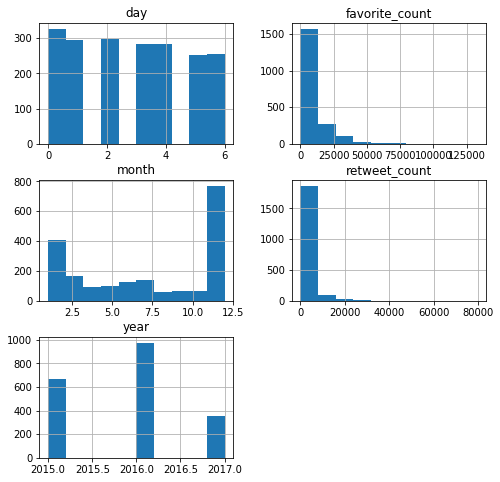

In [127]:
#see a histogram 
data.hist(figsize=(8,8));

In [128]:
#stats= data.drop(['id'], axis=1)
#stats.describe()
data.describe()

,day,year,month,retweet_count,favorite_count
count,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000
mean,2.843029,2015.846540,7.158475,2766.753260,8895.725677
std,1.999231,0.698734,4.121823,4674.698447,12213.193181
min,0.000000,2015.000000,1.000000,16.000000,81.000000
25%,1.000000,2015.000000,3.000000,624.750000,1982.000000
50%,3.000000,2016.000000,7.000000,1359.500000,4136.000000
75%,5.000000,2016.000000,11.000000,3220.000000,11308.000000
max,6.000000,2017.000000,12.000000,79515.000000,132810.000000


In [129]:
data.corr(method='pearson')

,day,year,month,retweet_count,favorite_count
day,1.000000,-0.008273,-0.010923,0.004615,-0.004426
year,-0.008273,1.000000,-0.719432,0.348291,0.566068
month,-0.010923,-0.719432,1.000000,-0.103989,-0.177089
retweet_count,0.004615,0.348291,-0.103989,1.000000,0.912947
favorite_count,-0.004426,0.566068,-0.177089,0.912947,1.000000


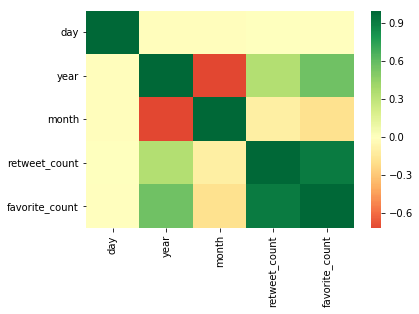

In [130]:
#Correlation Matrix
corr = data.corr()
corr = (corr)
sns.heatmap(corr,
xticklabels=corr.columns.values,
yticklabels=corr.columns.values,
cmap="RdYlGn", center=0)

In [131]:
data.columns

Index(['id', 'timestamp', 'name', 'dog_stage', 'source', 'text', 'day', 'year',
       'month', 'prediction', 'retweet_count', 'favorite_count'],
      dtype='object')

In [132]:
# 5 most common dog names
pop_names = data['name']
count = Counter(pop_names)
count.most_common(5)

[(nan, 634), ('Charlie', 11), ('Lucy', 10), ('Oliver', 10), ('Cooper', 10)]

In [133]:
data['name'].sample(10)

969          NaN
608          NaN
1750     Bentley
145         Zeek
1917         Jed
742          NaN
1927       Penny
1203      Edmund
358     Leonidas
1200      Tucker
Name: name, dtype: object

In [134]:
data.name.value_counts()

Charlie     11
Lucy        10
Oliver      10
Cooper      10
Tucker       9
Penny        9
Winston      8
Sadie        8
Daisy        7
Lola         7
Toby         7
Jax          6
Stanley      6
Bella        6
Bo           6
Koda         6
Buddy        5
Scout        5
Milo         5
Dave         5
Bailey       5
Louis        5
Oscar        5
Chester      5
Rusty        5
Leo          5
One          4
Archie       4
Brody        4
Gus          4
            ..
Donny        1
Karll        1
Terrenth     1
Aja          1
Dietrich     1
Blu          1
Tripp        1
Duchess      1
Socks        1
Willy        1
Pippin       1
Jeffri       1
Leonard      1
Rhino        1
Tuco         1
Derby        1
Mason        1
Julio        1
Cheesy       1
Tonks        1
Hero         1
Dudley       1
Jockson      1
Dwight       1
Ronnie       1
Mitch        1
Klein        1
Malikai      1
Ozzy         1
Marty        1
Name: name, Length: 919, dtype: int64

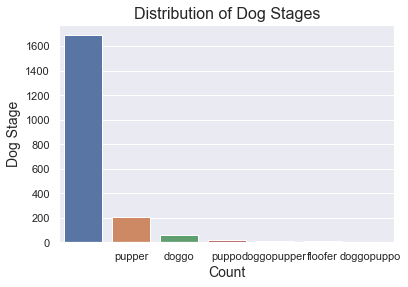

In [135]:
#dog_stage distribution
sorted_stage = data['dog_stage'].value_counts().head(7).index
sns.set(style="darkgrid")
sns.countplot(data = data, x = 'dog_stage', order = sorted_stage, orient = 'h')
plt.xticks(rotation = 360)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Dog Stage', fontsize=14)
plt.title('Distribution of Dog Stages',fontsize=16);

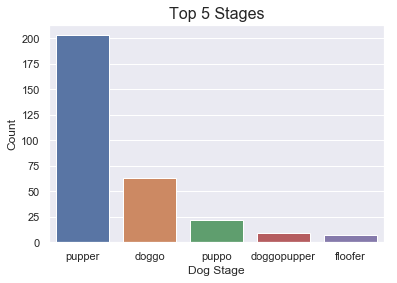

In [136]:
sorted_stage = data['dog_stage'].value_counts()[1:6].index
sns.countplot(data = data, x = 'dog_stage', order = sorted_stage, orient = 'h')
plt.xlabel('Dog Stage', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Top 5 Stages',fontsize=16)
plt.savefig('top_dog_stages.png');

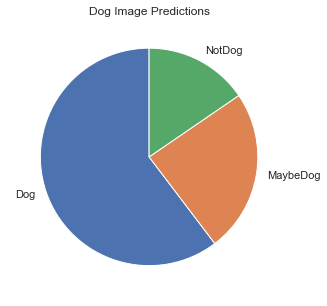

In [137]:
data['prediction'].value_counts().plot(kind='pie', figsize=(5,5), startangle=90)
plt.title('Dog Image Predictions')
plt.ylabel('');

In [138]:
#It is assumed the week starts on Monday, which is denoted by 0 and ends on Sunday which is denoted by 6. 

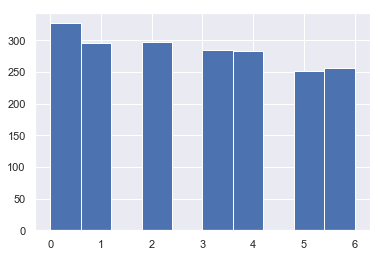

In [140]:
data['day'].hist();

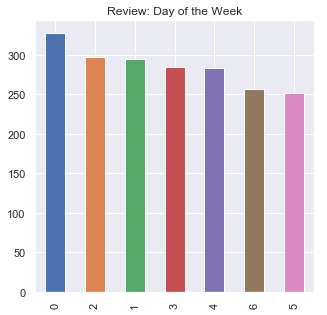

In [141]:
data['day'].value_counts().plot(kind='bar', figsize=(5,5))
plt.title('Review: Day of the Week')
plt.ylabel('');

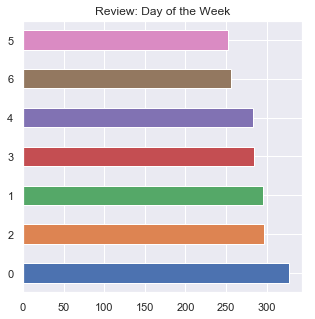

In [142]:
data['day'].value_counts().plot(kind='barh', figsize=(5,5))
plt.title('Review: Day of the Week')
plt.ylabel('');

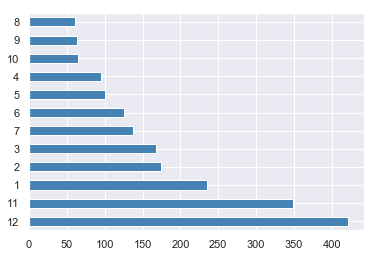

In [143]:
tweets_month = data['month'].value_counts()
tweets_month.plot(kind = 'barh', color='steelblue')
plt.savefig('month-tweets.png');

In [145]:
data.columns

Index(['id', 'timestamp', 'name', 'dog_stage', 'source', 'text', 'day', 'year',
       'month', 'prediction', 'retweet_count', 'favorite_count'],
      dtype='object')

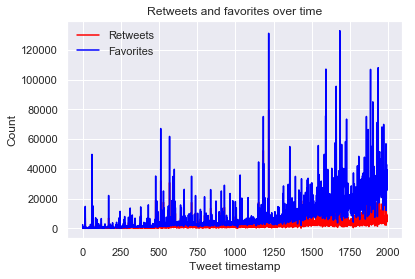

In [146]:
#favorite & retweet comparison 1
data['retweet_count'].plot(color = 'red', label='Retweets')
data['favorite_count'].plot(color = 'blue', label='Favorites')
plt.style.use('seaborn-darkgrid')
plt.legend(loc='upper left')
plt.xlabel('Tweet timestamp')
plt.ylabel('Count')
plt.title('Retweets and favorites over time')
plt.savefig('retweets_favorites.png')
plt.show()

/Users/Irene/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:2262: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/Users/Irene/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


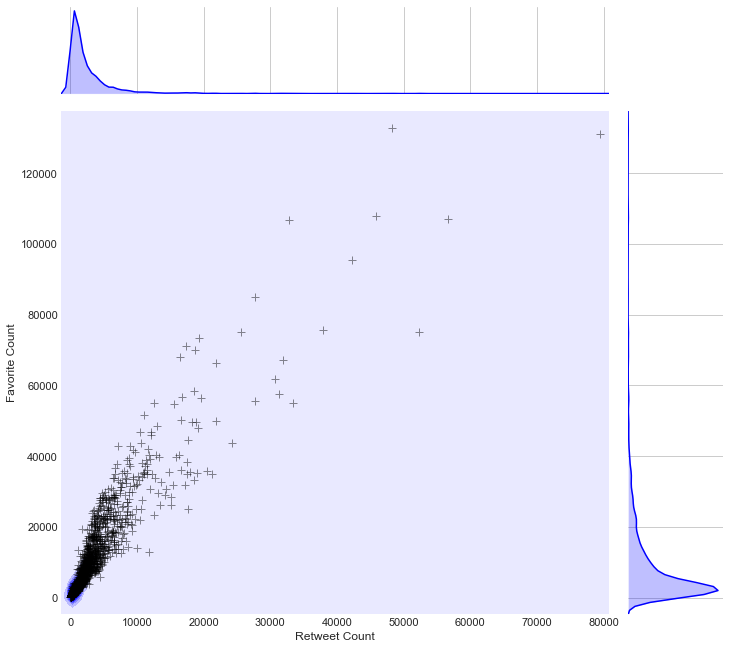

In [147]:
#favorite & retweet count comparison 2
sns.set_style('whitegrid')
g = sns.jointplot(x="retweet_count", 
                  y="favorite_count", 
                  data=data, 
                  color="blue",
                  kind="kde", 
                  size=10)
g.plot_joint(plt.scatter,  
             c="black",
             s=80, 
             linewidth=1, 
             marker="+",
             alpha=0.45)
g.set_axis_labels("Retweet Count", "Favorite Count",fontsize=12)

g.fig.subplots_adjust(top=0.9)
#sns.plt.suptitle('correlation review: retweet and favorite counts',
                 #fontsize=16);


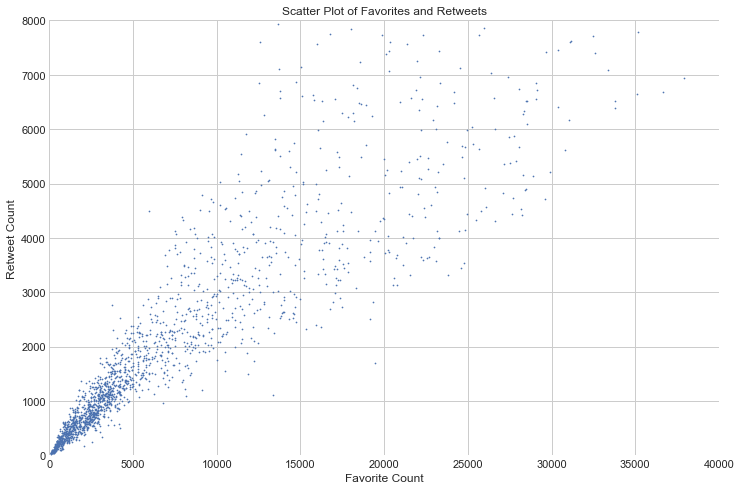

In [148]:
# Scatter plot of favorites and retweets.
plt.figure(figsize=(12, 8))
plt.xlim(0, 40000)
plt.ylim(0, 8000)
plt.xlabel('Favorite Count')
plt.ylabel('Retweet Count')
plt.plot(data.favorite_count, 
    data.retweet_count, linestyle='', 
     marker='o', markersize=0.7)
plt.title('Scatter Plot of Favorites and Retweets');

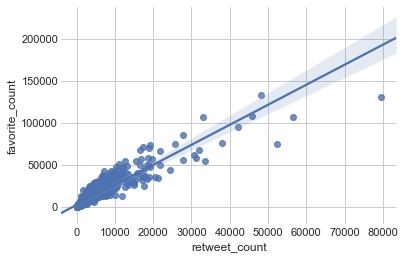

In [149]:
#favorite & retweet count comparison 2
sns.regplot(x="retweet_count", y="favorite_count", data=data);

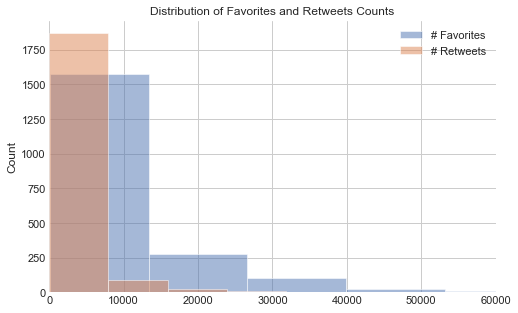

In [150]:
# Histograms of favorites and retweets
plt.figure(figsize=(8, 5))
plt.xlim(0, 60000)
plt.ylabel('Count')
plt.hist(data.favorite_count, alpha=.5, label='# Favorites')
plt.hist(data.retweet_count, alpha=.5, label='# Retweets')
plt.title('Distribution of Favorites and Retweets Counts')
plt.legend();

In [151]:
data.source.value_counts()

Twitter iPhone    1955
Twitter Web         28
TweetDeck           11
Name: source, dtype: int64

## TO DO

In [ ]:
data['first_prediction'].value_counts().head(10)

In [ ]:
sns.set(style='darkgrid')
ax = sns.distplot(data['first_prediction'])